# Introduction

In this notebook we attempt to predict the BTC price using LSTMs. We use just the close price when predicting the next close price(s). Since we only use the close price this is a univariate LSTM.

We use Keras to build the model, and use a 1D Convolutional layer as the initial layer, followed by an LSTM layer and regularization by dropout layers. 

* window length: the number of previous data points in the sequence to use in making the forecast
* output length: how many subsequent data points to predict from the previous
* neurons: how many neurons in the hidden LSTM layers
* epochs: how many epochs to train over
* dropout: probability of dropout - this helps regularize the network and avoid overfitting.

# This notebook

This particular notebook will explore using minute-wise data over relatively short date ranges.

# Import utils and helper functions

In [3]:
%run utils.ipynb

2.4.1


# Get the stocks data

In [4]:
df = get_stocks_df()

Connecting to the PostgreSQL database...
Connection successful


In [5]:
df.head()

,close,volume
dt,,
2015-10-08 13:40:00+00:00,242.50,0.050000
2015-10-08 13:41:00+00:00,242.95,0.001000
2015-10-08 13:42:00+00:00,242.95,NaN
2015-10-08 13:43:00+00:00,242.96,0.010000
2015-10-08 13:44:00+00:00,242.96,0.033491


# Attempt 1

This attempt uses 20 neurons, a window size of 5 (meaning the previous 5 values are used to make the prediction of the next value),
and an output size of 1 (meaning just 1 price point ahead is forecast). It uses minute-by-minute data (no resampling), so we train over just a couple of months

In [6]:
## Config dict that defines this attempt
config = {
    "neurons": 512,                 # number of hidden units in the LSTM layer
    "activation_function": 'tanh',   # activation function for LSTM and Dense layer
    "loss": 'mse',                   # loss function for calculating the gradient, in this case Mean Squared Error. Could be mae
    "optimizer": 'adam',              # optimizer for appljying gradient decent
    "dropout": 0.25,                 # dropout ratio used after each LSTM layer to avoid overfitting
    "batch_size": 128,              
    "epochs": 20,                  
    "window_len": 5,                 # is an int to be used as the look back window for creating a single input sample.
    "training_size": 0.8,            # porportion of data to be used for training
    "shuffle_buffer": 1000,          # When shuffling the windowed Dataset how many at once to load into memory
    "output_size": 1,
    "start_date": '2021-01-01',
    "end_date": '2021-02-19',
}

In [7]:
# Clean up the memory
tf.keras.backend.clear_session()
model = build_model(config['output_size'], config['neurons'], config['activation_function'],
                    config['dropout'], config['loss'], config['optimizer'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, None, 25)          150       
_________________________________________________________________
lstm (LSTM)                  (None, None, 512)         1101824   
_________________________________________________________________
dropout (Dropout)            (None, None, 512)         0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 512)               2099200   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 513       
Total params: 3,201,687
Trainable params: 3,201,687
Non-trainable params: 0
______________________________________________

In [8]:
scaler, model_training_data, training_data, test_data, training_dates, test_dates = preprocessing(df, scaler='minmax', **config)

MinMax scaler


In [9]:
history = model.fit(model_training_data, epochs=config['epochs'], batch_size=config['batch_size'], verbose=1)

Epoch 1/20
441/441 [==============================] - 173s 386ms/step - loss: 5.2704e-04 - mae: 0.0168
Epoch 2/20
441/441 [==============================] - 166s 376ms/step - loss: 0.0033 - mae: 0.0243
Epoch 3/20
441/441 [==============================] - 164s 372ms/step - loss: 0.0016 - mae: 0.0236
Epoch 4/20
441/441 [==============================] - 164s 371ms/step - loss: 2.6146e-04 - mae: 0.0124
Epoch 5/20
441/441 [==============================] - 166s 376ms/step - loss: 1.8151e-04 - mae: 0.0104
Epoch 6/20
441/441 [==============================] - 166s 375ms/step - loss: 2.1744e-04 - mae: 0.0110
Epoch 7/20
441/441 [==============================] - 165s 373ms/step - loss: 1.9019e-04 - mae: 0.0105
Epoch 8/20
441/441 [==============================] - 164s 371ms/step - loss: 1.9659e-04 - mae: 0.0102
Epoch 9/20
441/441 [==============================] - 169s 383ms/step - loss: 1.2535e-04 - mae: 0.0084
Epoch 10/20
441/441 [==============================] - 168s 382ms/step - loss: 1.

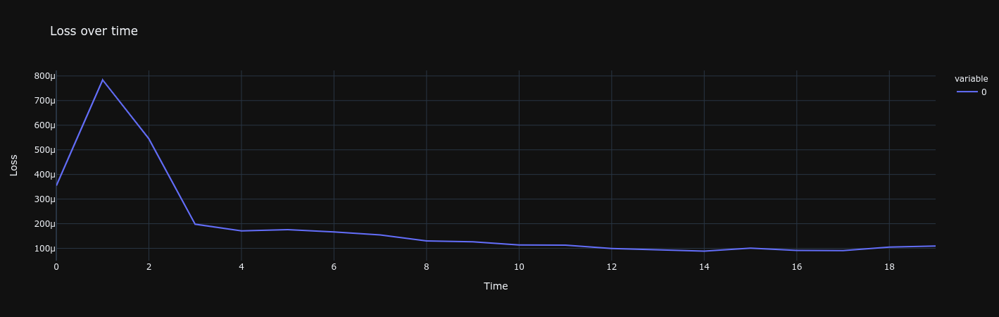

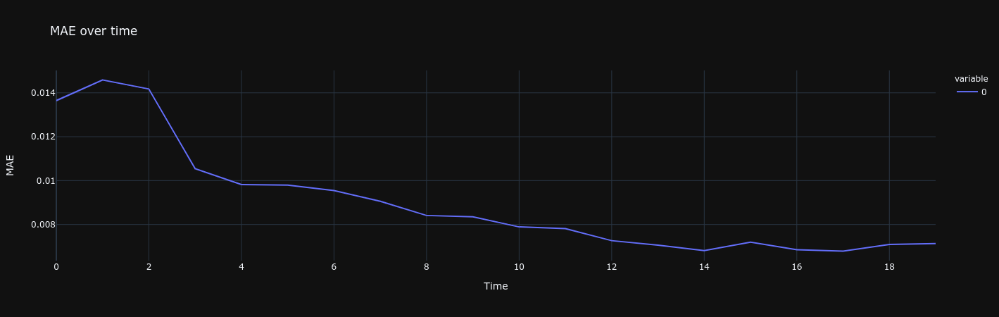

In [10]:
display_history(history)

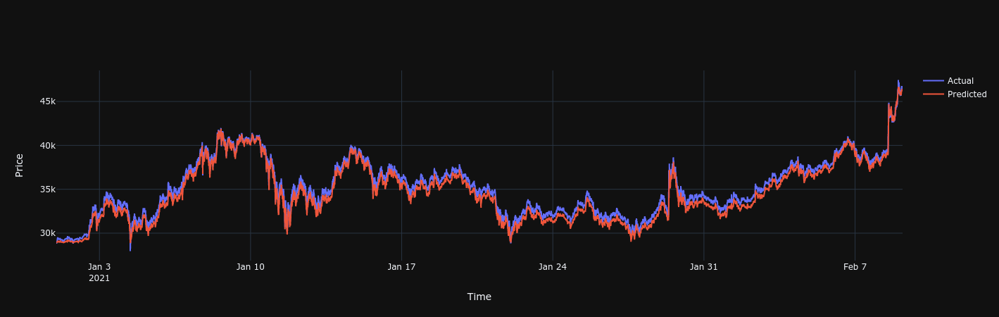

The MAE is 0.029883832505761022


In [13]:
train_res_df = display_results(model, scaler, training_data, training_dates, config['window_len'], config['output_size'])

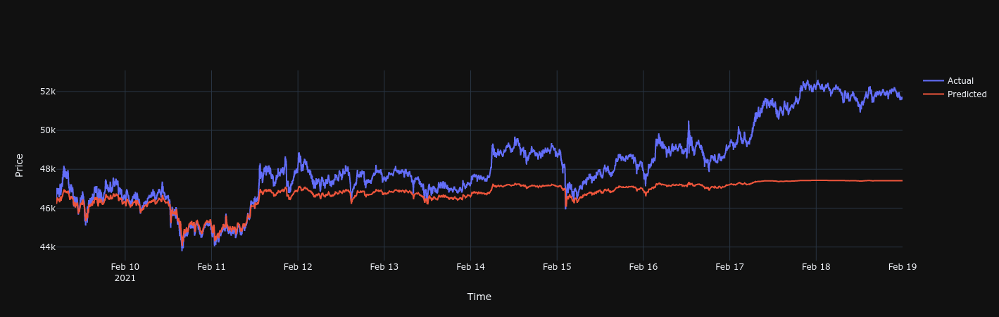

The MAE is 0.07779651346424765


In [14]:
test_res_df = display_results(model, scaler, test_data, test_dates, config['window_len'], config['output_size'])

## Summary

It seems that despite a great fit on the test set, as soon as we start predicting more than a couple of days in the future on the test set then the actual and predicted prices begin to diverge